# Corporación Favorita Time Series - Modeling

***
<br>




<img src="../../reports/img/Corporación_Favorita_Logo.png" width=400 height=300 />

<br>

<br>

### Table of Contents

- [Goal review and possible ways forward](#goal)
- [Importing Libraries](#importing)
- [Loading Data](#loading)
- [Modeling 1 Family](#modeling)
    - [ARIMA](#arima)
    - [Facebook's Prophet](#facebook)
    - [RNN](#rnn)
- [Modeling all Families](#all)
    - [ARIMA](#arima_all)
    - [Facebook's Prophet](#facebook_all)
    - [RNN](#rnn_all)

<a id='goal'></a>

## Goal Review & possible ways forward

***

<div class="span5 alert alert-success">
<h3>Goal</h3>
    <p>Our initial goal for this project was to see if we can accurately forecast sales across the existing family of products for our selected store.<p>
</div>

<div class='alert alert-info'>
    <p>Note: The following theory and code snippets come from <a href='https://tklouie.github.io/'>Tamara Louie</a> and her <a href='https://www.youtube.com/watch?v=JntA9XaTebs&t=3435s'>2018 PyData talk </a></p>
</div>

In [1]:
from IPython.display import YouTubeVideo
YouTubeVideo('JntA9XaTebs&t', width=600, height=300)

### **What techniques may help answer these questions?**

**Statistical models**

- Ignore the time-series aspect completely and model using traditional statistical modeling toolbox.
    - Examples. Regression-based models.
- Univariate statistical time-series modeling.
    - Examples. Averaging and smoothing models, ARIMA models.
- Slight modifications to univariate statistical time-series modeling.
    - Examples. External regressors, multi-variate models.
- Additive or component models.
    - Examples. Facebook Prophet package.
- Structural time series modeling.
    - Examples. Bayesian structural time series modeling, hierarchical time series modeling.

**Machine learning models**
- Ignore the time-series aspect completely and model using traditional machine learning modeling toolbox.
    - Examples. Support Vector Machines (SVMs), Random Forest Regression, Gradient-Boosted Decision Trees (GBDTs).
- Hidden markov models (HMMs).
- Other sequence-based models.
- Gaussian processes (GPs).
- Recurrent neural networks (RNNs).

**Additional data considerations before choosing a model**
- Whether or not to incorporate external data
- Whether or not to keep as univariate or multivariate (i.e., which features and number of features)
- Outlier detection and removal
- Missing value imputation

<a id='importing'></a>

## Importing libraries

***

**Note:** On previous notebooks I was using `python 3.9` but at the time of doing this, `tensorflow` was not available for this python version, I had to revert to `3.8`. 

In [1]:
# data wrangiling libraries
import pandas as pd
import numpy as np

# visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# machine learning libraries
import sklearn
import statsmodels.api as sm
from sklearn.feature_extraction import text
from sklearn.utils import class_weight
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer, accuracy_score, roc_auc_score, matthews_corrcoef, balanced_accuracy_score #classification_report, confusion_matrix, accuracy_score, f1_score, precision_score, recall_score, 
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import SGDClassifier

#from tensorflow.keras.preprocessing.text import text_to_word_sequence --> Tensorflow not yet available for Python 3.9

# timeseries
from datetime import datetime, timedelta
from fbprophet import Prophet

# other libraries
import os
import re
import sys
import random
import string
import pickle
import itertools
import time
import warnings
import math
from tqdm import tqdm, tqdm_pandas


# settings
%matplotlib inline
tqdm.pandas(desc="Progress!")
sns.set()
dateparse = lambda x: datetime.strptime(x, '%Y-%m-%d')
warnings.simplefilter(action='ignore', category=FutureWarning)
plt.rcParams.update({'figure.max_open_warning': 0})

Importing plotly failed. Interactive plots will not work.


<a id='loading'></a>

## Loading our dataset

***

In [2]:
# We load the datasets
df = pd.read_csv('../../data/stationary/train_clean_stationary.csv', 
                 parse_dates=['date'], date_parser=dateparse, 
                 dtype={'id': int, 'store_nbr': int, 'item_nbr': int, 'unit_sales': float, 'onpromotion': object})

In [3]:
df.head()

,date,id,item_nbr,unit_sales,onpromotion,family,class,perishable,transactions,type,dow,oil_price_log_diff
0,2013-01-02,578,103665,2.0,No Info,BREAD/BAKERY,2712,1,2111.0,Work Day,2,NaN
1,2013-01-02,579,105574,8.0,No Info,GROCERY I,1045,0,2111.0,Work Day,2,NaN
2,2013-01-02,580,105575,15.0,No Info,GROCERY I,1045,0,2111.0,Work Day,2,NaN
3,2013-01-02,581,105577,2.0,No Info,GROCERY I,1045,0,2111.0,Work Day,2,NaN
4,2013-01-02,582,105737,2.0,No Info,GROCERY I,1044,0,2111.0,Work Day,2,NaN


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2568829 entries, 0 to 2568828
Data columns (total 12 columns):
 #   Column              Dtype         
---  ------              -----         
 0   date                datetime64[ns]
 1   id                  int64         
 2   item_nbr            int64         
 3   unit_sales          float64       
 4   onpromotion         object        
 5   family              object        
 6   class               int64         
 7   perishable          int64         
 8   transactions        float64       
 9   type                object        
 10  dow                 int64         
 11  oil_price_log_diff  float64       
dtypes: datetime64[ns](1), float64(3), int64(5), object(3)
memory usage: 235.2+ MB


In [5]:
df = df.set_index('date')

In [6]:
print(sys.getsizeof(df), ' bytes')

679360227  bytes


<a id='train_test'></a>

## Train and Test dataset
***

We are going to separate the dataset into two parts, the train dataset and the test dataset. The actual Kaggle competition allows you to submit your model and they use 2 weeks of company sales to evaluate how well it performs. Since we are only forecasting the sales of one of the 54 stores, we will create our own test dataset. We will do this by trying to predict the sales of the last 15 days of our dataset (from August 1 2017 to August 15 2017)

In [87]:
poultry = df[df['family'] == 'POULTRY'].groupby('date').mean()[['unit_sales']]
poultry = poultry.asfreq('D')
poultry = poultry.fillna(0)

In [88]:
start_forecast = '2017-08-01'
finish_forecast = '2017-08-15'

In [89]:
train = poultry[poultry.index < start_forecast]
test = poultry[poultry.index >= start_forecast]

In [90]:
y_true = test['unit_sales'].to_list()

In [11]:
#here we define the metrics of how well our models perform

def calculate_mape(y_true, y_pred):
    """ Calculate mean absolute percentage error (MAPE)"""
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def calculate_mpe(y_true, y_pred):
    """ Calculate mean percentage error (MPE)"""
    return np.mean((y_true - y_pred) / y_true) * 100

def calculate_mae(y_true, y_pred):
    """ Calculate mean absolute error (MAE)"""
    return np.mean(np.abs(y_true - y_pred)) * 100

def calculate_rmse(y_true, y_pred):
    """ Calculate root mean square error (RMSE)"""
    return np.sqrt(np.mean((y_true - y_pred)**2))

def print_error_metrics(y_true, y_pred):
    print('MAPE: %f'%calculate_mape(y_true, y_pred))
    print('MPE: %f'%calculate_mpe(y_true, y_pred))
    print('MAE: %f'%calculate_mae(y_true, y_pred))
    print('RMSE: %f'%calculate_rmse(y_true, y_pred))
    return

<a id='modeling'></a>

## Modeling
***

<a id=arima></a>


### ARIMA Model

ARIMA = Auto-Regressive Integrated Moving Average.
Assumptions. The time-series is stationary.
Depends on:
1. Number of AR (Auto-Regressive) terms (p).
2. Number of I (Integrated or Difference) terms (d).
3. Number of MA (Moving Average) terms (q).


**ACF and PACF Plots**

How do we determine p, d, and q? For p and q, we can use ACF and PACF plots (below).

- Autocorrelation Function (ACF). Correlation between the time series with a lagged version of itself (e.g., correlation of Y(t) with Y(t-1)).
- Partial Autocorrelation Function (PACF). Additional correlation explained by each successive lagged term.

How do we interpret ACF and PACF plots?

- p – Lag value where the PACF chart crosses the upper confidence interval for the first time.
- q – Lag value where the ACF chart crosses the upper confidence interval for the first time.

More information on this point ([link](https://stats.stackexchange.com/a/45078/292378))

In [91]:
# Import required libraries
from statsmodels.graphics import tsaplots

def autocorrelation_plots(dataframe, column, title_text=None, n_lags=30, save=True, save_as='acf_pacf.png'):
    
    '''Will show the acf and pacf plots and return the q and p values'''
    
    if sum(dataframe[column].isna()) > 0:
        print('Missing values have been dropped')
        print()
        
    fig, ax = plt.subplots(2, sharex=True, figsize=(12,8))
    ax0 = tsaplots.plot_acf(dataframe[column].dropna(), lags=n_lags, ax=ax[0], title='Autocorrelation '+title_text)
    ax1 = tsaplots.plot_pacf(dataframe[column].dropna(), lags=n_lags, ax=ax[1], title='Partial Autocorrelation '+title_text)

    # Show plot
    if save == True:
        plt.savefig('img/ACF_PACF/'+save_as+'.png', bbox_inches='tight',transparent=True)
    else:
        pass
    
    acf, ci = sm.tsa.acf(dataframe[column], alpha=0.05, nlags=n_lags)
    q = 0
    for i, num in enumerate(acf):
        if num > 0.05 and i != 0:
            q = i
            break

    pacf, ci = sm.tsa.pacf(dataframe[column], alpha=0.05, nlags=n_lags)
    p = 0
    for i, num in enumerate(pacf):
        if num > 0.05 and i != 0:
            p = i
            break

    plt.show()
    
    return q, p

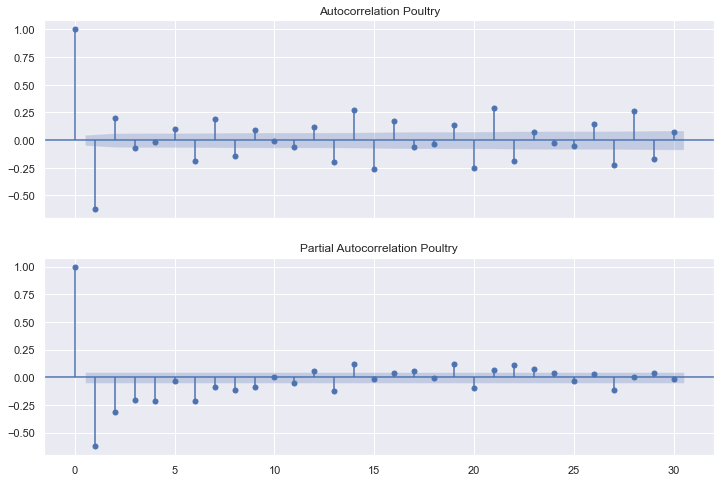

In [92]:
q, p = autocorrelation_plots(train,'unit_sales', title_text='Poultry', n_lags=30, save=True, save_as='poultry_ACF_PACF')

In [93]:
def run_arima_model(df, ts, p, d, q, save_as):
    """
    Run ARIMA model
    """
    from statsmodels.tsa.arima.model import ARIMA

    # fit ARIMA model on time series
    model = ARIMA(df[ts], order=(p, d, q))  
    results_ = model.fit(method='innovations_mle')  

    # get lengths correct to calculate RSS
    len_results = len(results_.fittedvalues)
    ts_modified = df[ts][-len_results:]

    # calculate root mean square error (RMSE) and residual sum of squares (RSS)
    rss = sum((results_.fittedvalues - ts_modified)**2)
    rmse = np.sqrt(rss / len(df[ts]))

    # plot fit
    plt.plot(df[ts])
    plt.plot(results_.fittedvalues, color = 'red')
    plt.title('For ARIMA model (%i, %i, %i) for ts %s, RSS: %.4f, RMSE: %.4f' %(p, d, q, ts, rss, rmse))

    plt.savefig('img/ARIMA/'+save_as+'_ARIMA_p{}_d{}_q{}.png'.format(p,d,q), transparent=True, bbox_inches='tight')
    plt.show()
    plt.close()

    return model, results_, rmse

/Users/diego/.pyenv/versions/venv-time-series-temp/lib/python3.8/site-packages/statsmodels/tsa/arima/model.py:356: UserWarning: Provided `endog` series has been differenced to eliminate integration prior to parameter estimation by method "innovations_mle".
  warnings.warn('Provided `endog` series has been differenced'


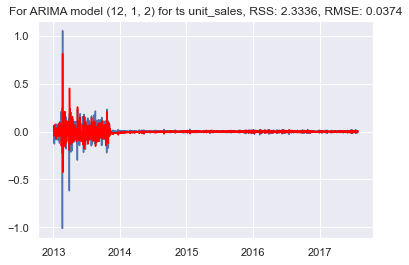

In [94]:
model, results, rmse = run_arima_model(df = train, 
                           ts = 'unit_sales', 
                           p = p, 
                           d = 1, 
                           q = q,
                           save_as='poultry')

In [95]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             unit_sales   No. Observations:                 1672
Model:                ARIMA(12, 1, 2)   Log Likelihood                3138.583
Date:                Wed, 20 Jan 2021   AIC                          -6247.165
Time:                        18:10:58   BIC                          -6165.847
Sample:                    01-02-2013   HQIC                         -6217.035
                         - 07-31-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.6374      0.055    -30.022      0.000      -1.744      -1.530
ar.L2         -1.4028      0.057    -24.798      0.000      -1.514      -1.292
ar.L3         -1.1415      0.048    -23.695      0.000      -1.236      -1.047
ar.L4         -0.9743      0.047    -20.520      0.000      -1.067      -0.881
ar.L5         -0.8204      0.050    -16.310      0.000      -0.919      -0.722
ar.L6         -0.7746      0.051    -15.180      0.000      -0.875      -0.675
ar.L7         -0.6368      0.046    -13.745      0.000      -0.728      -0.546
ar.L8         -0.4637      0.042    -10.924      0.000      -0.547      -0.380
ar.L9         -0.2990      0.040     -7.498      0.000      -0.377      -0.221
ar.L10        -0.1307      0.035     -3.688      0.000      -0.200      -0.061
ar.L11        -0.0378      0.031     -1.218      0.223      -0.099       0.023
ar.L12         0.0487      0.018      2.750      0.006       0.014       0.083
ma.L1         -0.3361      0.054     -6.187      0.000      -0.443      -0.230
ma.L2         -0.6483      0.053    -12.310      0.000      -0.752      -0.545
sigma2         0.0014   1.33e-05    102.633      0.000       0.001       0.001
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):           1360133.40
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               0.01   Skew:                            -6.75
Prob(H) (two-sided):                  0.00   Kurtosis:                       142.12
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Predicting values

In [96]:
predictions = results.predict(start=start_forecast, end=finish_forecast)

In [97]:
print_error_metrics(y_true=y_true, y_pred=predictions)

MAPE: 176.863568
MPE: 83.533921
MAE: 0.636394
RMSE: 0.007615


<a id=facebook></a>


### Facebook's Prophet

[Link to the package](https://facebook.github.io/prophet/)


In [19]:
def days_between(d1, d2):
    """Calculate the number of days between two dates.  D1 is start date (inclusive) and d2 is end date (inclusive)"""
    d1 = datetime.strptime(d1, "%Y-%m-%d")
    d2 = datetime.strptime(d2, "%Y-%m-%d")
    return abs((d2 - d1).days + 1)

In [20]:
# Inputs for query
first_date = min(train.index).date().isoformat()
last_date = max(train.index).date().isoformat()
date_column = 'date'
metric_column = 'unit_sales'
table = train.reset_index()
start_training_date = first_date
end_training_date = last_date
start_forecasting_date = max(table['date']).date() + timedelta(days=1)
end_forecasting_date = max(table['date']).date() + timedelta(days=15)
year_to_estimate = '2017'

# Inputs for forecasting

# Future_num_points. If doing different time intervals, change future_num_points
future_num_points = abs(start_forecasting_date-end_forecasting_date).days+1

cap = None 

# growth: default = 'linear', you can also choose 'logistic'
growth = 'linear'

# n_changepoints: default = 25, uniformly placed in first 80% of time series
n_changepoints = 25 

# changepoint_prior_scale: default = 0.05 Increasing it will make the trend more flexible
changepoint_prior_scale = 0.05 

# changpoints: example = ['2016-01-01']
changepoints = None 

# holidays_prior_scale: default = 10.If you find that the holidays are overfitting, you can adjust their prior scale to smooth them
holidays_prior_scale = 10 

# interval_width: default = 0.8
interval_width = 0.8 

# mcmc_samples: default = 0
# By default Prophet will only return uncertainty in the trend and observation noise.
# To get uncertainty in seasonality, you must do full Bayesian sampling. 
# Replaces typical MAP estimation with MCMC sampling, and takes MUCH LONGER - e.g., 10 minutes instead of 10 seconds.
# If you do full sampling, then you will see the uncertainty in seasonal components when you plot:
mcmc_samples = 0

holidays = df[df['type'] == 'Holiday'][['type']].reset_index()
holidays.columns = ['ds','holiday']

daily_seasonality = True

In [21]:
# get relevant data
df_prophet = table[['date','unit_sales']] 

# reset index
#df_prophet = df_prophet.reset_index()

# rename columns
df_prophet = df_prophet.rename(columns = {'date': 'ds', 'unit_sales': 'y'}) # can try with ts_log_diff

# Change 'ds' type from datetime to date (necessary for FB Prophet)
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])

# Change 'y' type to numeric (necessary for FB Prophet)
df_prophet['y'] = pd.to_numeric(df_prophet['y'], errors='ignore')

# Remove any outliers
# df.loc[(df_['ds'] > '2016-12-13') & (df_['ds'] < '2016-12-19'), 'y'] = None

In [22]:
def create_daily_forecast(df,
#                         cap,
                          holidays,
                          growth,
                          n_changepoints = 25,
                          changepoint_prior_scale = 0.05,
                          changepoints = None,
                          holidays_prior_scale = 10,
                          interval_width = 0.8,
                          mcmc_samples = 1,
                          future_num_points = 15, 
                          daily_seasonality = True,
                          save_as='prophet'):
    """
    Create forecast
    """

    # Create copy of dataframe
    df_ = df.copy()

    # Add in growth parameter, which can change over time
    #df_['cap'] = max(df_['y']) if cap is None else cap

    # Create model object and fit to dataframe
    m = Prophet(growth = growth,
              n_changepoints = n_changepoints,
              changepoint_prior_scale = changepoint_prior_scale,
              changepoints = changepoints,
              holidays = holidays,
              holidays_prior_scale = holidays_prior_scale,
              interval_width = interval_width,
              mcmc_samples = mcmc_samples, 
              daily_seasonality = daily_seasonality)

    # Fit model with dataframe
    m.fit(df_)

    # Create dataframe for predictions
    future = m.make_future_dataframe(periods = future_num_points)
    #     future['cap'] = max(df_['y']) if cap is None else cap

    # Create predictions
    fcst = m.predict(future)

    # Plot
    path='img/Prophet/'+save_as+'_forecast.png'
    m.plot(fcst).savefig(path)
    m.plot_components(fcst).savefig(path)

    return fcst

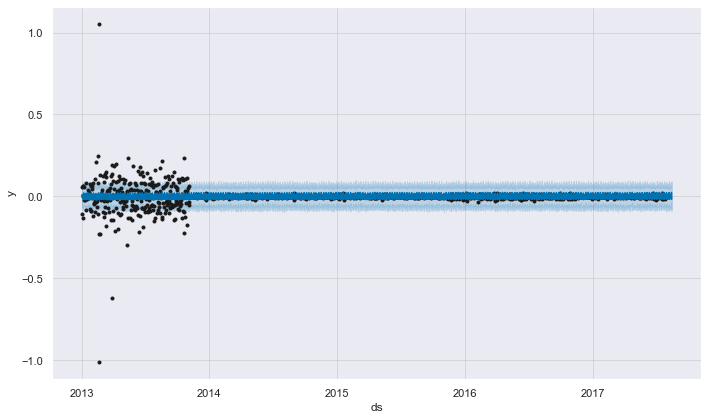

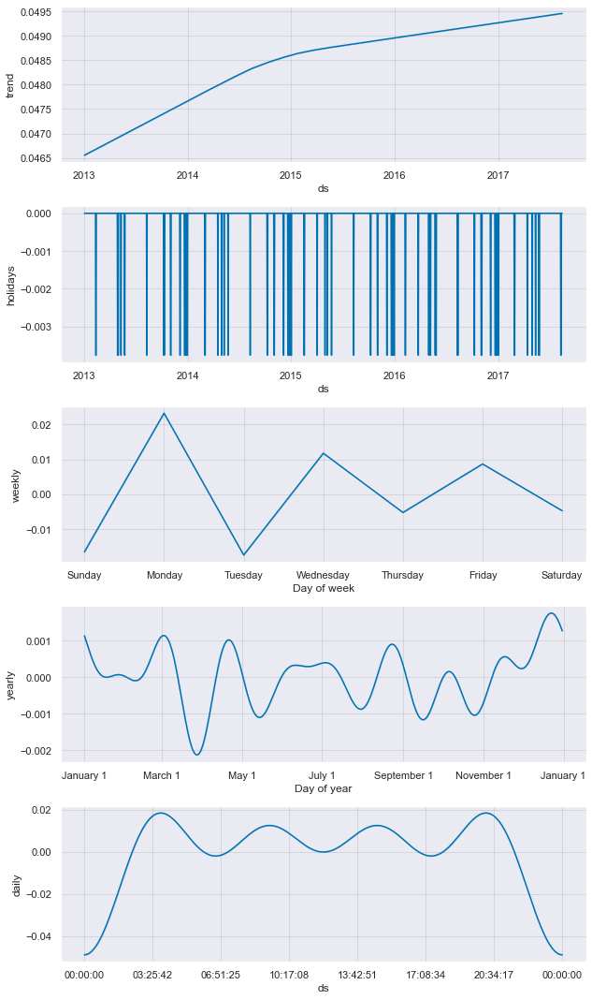

In [23]:
fcst = create_daily_forecast(df_prophet,
                             #cap,
                             holidays,
                             growth,
                             n_changepoints,
                             changepoint_prior_scale,
                             changepoints, 
                             holidays_prior_scale,
                             interval_width,
                             mcmc_samples,
                             future_num_points, 
                             daily_seasonality,
                            save_as='poultry')

In [24]:
print_error_metrics(y_true = df_prophet['y'], y_pred = fcst['yhat'])

MAPE: inf
MPE: nan
MAE: 2.254906
RMSE: 0.053096


<a id=rnn></a>

<br>

### LSTM Model (Long-Short Term Memory)


Create LSTM model - Source: https://machinelearningmastery.com/time-series-prediction-lstm-recurrent-neural-networks-python-keras/

In [25]:
poultry = df[df['family'] == 'POULTRY'].groupby('date').mean()[['unit_sales']]
poultry = poultry.asfreq('D')
poultry = poultry.fillna(0)

In [30]:
def do_lstm_model(df, 
                  ts, 
                  look_back, 
                  epochs, 
                  type_ = None, 
                  use_as_test_last_days=15,
                 save_as='model'):
 
    # Import packages
    from pandas import read_csv
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense
    from tensorflow.keras.layers import LSTM
    from sklearn.preprocessing import MinMaxScaler
    from sklearn.metrics import mean_squared_error

    # Convert an array of values into a dataset matrix
    def create_dataset(dataset, look_back=1):
        """
        Create the dataset
        """
        dataX, dataY = [], []
        for i in range(len(dataset)-look_back-1):
            a = dataset[i:(i+look_back), 0]
            dataX.append(a)
            dataY.append(dataset[i + look_back, 0])
        return np.array(dataX), np.array(dataY)

    # Fix random seed for reproducibility
    np.random.seed(7)

    # Get dataset
    dataset = df[ts].values
    dataset = dataset.astype('float32')

    # Normalize the dataset
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset = scaler.fit_transform(dataset.reshape(-1, 1))

    # Split into train and test sets
    train, test = dataset[0:-use_as_test_last_days,:], dataset[-use_as_test_last_days:,:]

    # Reshape into X=t and Y=t+1
    look_back = look_back
    trainX, trainY = create_dataset(train, look_back)
    testX, testY = create_dataset(test, look_back)

    # Reshape input to be [samples, time steps, features]
    if type_ == 'regression with time steps':
        trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
        testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))
    elif type_ == 'stacked with memory between batches':
        trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
        testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))
    else:
        trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
        testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

    # Create and fit the LSTM network
    batch_size = 1
    model = Sequential()

    if type_ == 'regression with time steps':
        model.add(LSTM(4, input_shape=(look_back, 1)))
    elif type_ == 'memory between batches':
        model.add(LSTM(4, batch_input_shape=(batch_size, look_back, 1), stateful=True))
    elif type_ == 'stacked with memory between batches':
        model.add(LSTM(4, batch_input_shape=(batch_size, look_back, 1), stateful=True, return_sequences=True))
        model.add(LSTM(4, batch_input_shape=(batch_size, look_back, 1), stateful=True))
    else:
        model.add(LSTM(4, input_shape=(1, look_back)))

    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')

    if type_ == 'memory between batches' or type_ == 'stacked with memory between batches':
        for i in range(100):
            model.fit(trainX, trainY, epochs=1, batch_size=batch_size, verbose=2, shuffle=False)
            model.reset_states()
    else:
        model.fit(trainX, 
              trainY, 
              epochs = epochs, 
              batch_size = 1, 
              verbose = 2)

    # Make predictions
    if type_ == 'memory between batches' or type_ == 'stacked with memory between batches':
        trainPredict = model.predict(trainX, batch_size=batch_size)
        testPredict = model.predict(testX, batch_size=batch_size)
    else:
        trainPredict = model.predict(trainX)
        testPredict = model.predict(testX)

    # Invert predictions
    trainPredict = scaler.inverse_transform(trainPredict)
    trainY = scaler.inverse_transform([trainY])
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform([testY])

    # Calculate root mean squared error
    trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
    print('Train Score: %.2f RMSE' % (trainScore))
    testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
    print('Test Score: %.2f RMSE' % (testScore))

    # Shift train predictions for plotting
    trainPredictPlot = np.empty_like(dataset)
    trainPredictPlot[:, :] = np.nan
    trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict

    # Shift test predictions for plotting
    testPredictPlot = np.empty_like(dataset)
    testPredictPlot[:, :] = np.nan
    testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
    
    original = pd.DataFrame(scaler.inverse_transform(dataset), index=df.index)
    plot_train = pd.DataFrame(trainPredictPlot, index=df.index)
    plot_test = pd.DataFrame(testPredictPlot, index=df.index)
    
    # Plot baseline and predictions
    plt.figure(figsize=(10,6))
    plt.plot(original)
    plt.plot(plot_train)
    plt.plot(plot_test, 'g')
    plt.title(save_as+' - LSTM Model, train RMSE: {}, test RMSE: {}'.format(round(trainScore,2), round(testScore,2)), size=14, pad=20)
    plt.savefig('img/LSTM/'+save_as+'_LSTM.png', transparent=True, bbox_inches='tight')
    plt.show()
    plt.close()

    return model, trainScore, testScore

Epoch 1/5
1670/1670 - 3s - loss: 0.0081
Epoch 2/5
1670/1670 - 2s - loss: 0.0012
Epoch 3/5
1670/1670 - 2s - loss: 0.0011
Epoch 4/5
1670/1670 - 2s - loss: 9.7058e-04
Epoch 5/5
1670/1670 - 2s - loss: 8.8449e-04
Train Score: 0.06 RMSE
Test Score: 0.01 RMSE


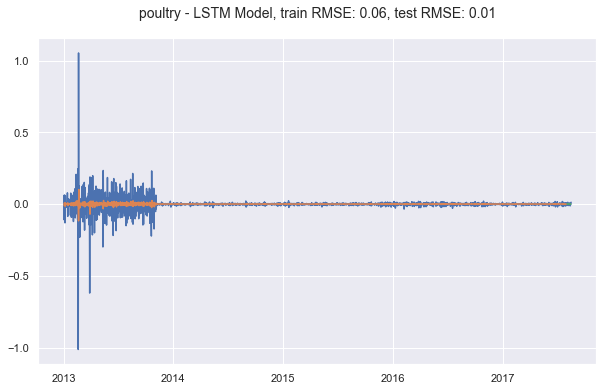

In [31]:
# LSTM Network for Regression
model, train_score, test_score = do_lstm_model(df=poultry,
                                                  ts = 'unit_sales', 
                                                  look_back = 1, 
                                                  epochs = 5,
                                                  use_as_test_last_days=15,
                                                  save_as='poultry')

<a id='all'></a>

## Modeling all the families of products
***

In [32]:
families = list(df.family.unique())

In [33]:
len(families)

32

In [34]:
# unfortunately we do not have data from "Home Appliances", "School and Office Supplies", and "BOOKS" to test our models, we will drop it for now.
df[df['family']=='HOME APPLIANCES'].tail(1).index.date[0]

datetime.date(2017, 7, 31)

In [35]:
df[df['family']=='SCHOOL AND OFFICE SUPPLIES'].tail(1).index.date[0]

datetime.date(2017, 5, 24)

In [36]:
df[df['family']=='BOOKS'].tail(1).index.date[0]

datetime.date(2017, 7, 31)

In [37]:
families.remove('HOME APPLIANCES')
families.remove('SCHOOL AND OFFICE SUPPLIES')
families.remove('BOOKS')

In [38]:
len(families)

29

In [39]:
families = sorted(families)

In [40]:
df_all = pd.DataFrame(columns=['ARIMA','Prophet','LSTM'], index=families)

In [41]:
df_all.head()

,ARIMA,Prophet,LSTM
AUTOMOTIVE,NaN,NaN,NaN
BEAUTY,NaN,NaN,NaN
BEVERAGES,NaN,NaN,NaN
BREAD/BAKERY,NaN,NaN,NaN
CELEBRATION,NaN,NaN,NaN


In [42]:
dictionary_all = {}

### Train Test for each family of products

In [43]:
def create_family_data(family):
    df_family = df[df['family'] == family].groupby('date').mean()[['unit_sales']]
    df_family = df_family.asfreq('D')
    df_family = df_family.fillna(0)

    train = df_family[df_family.index < start_forecast]
    test = df_family[df_family.index >= start_forecast]

    y_true = test['unit_sales'].to_list()
    
    return train, test, y_true

<a id=arima_all></a>

### ARIMA All

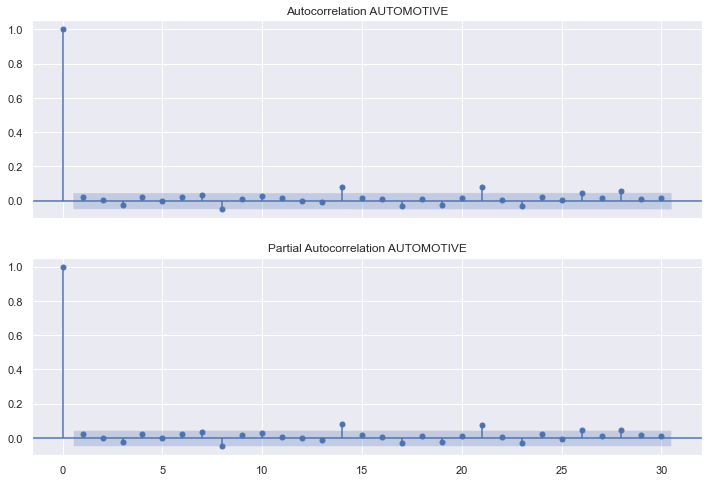

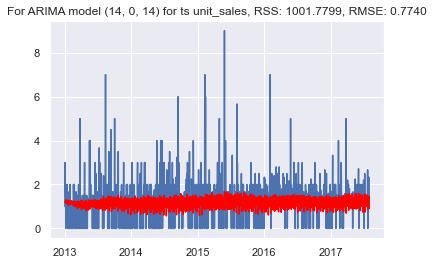

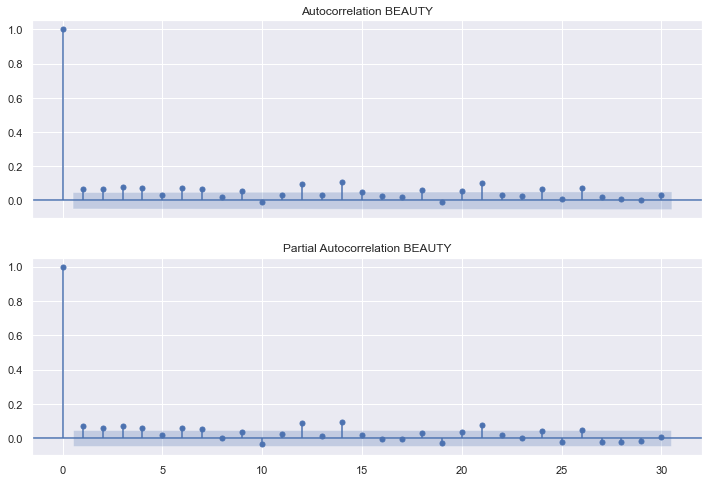

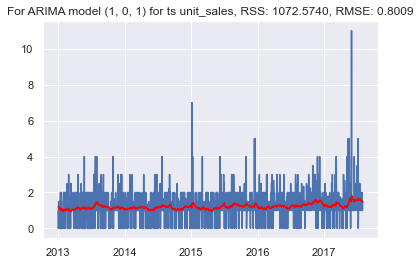

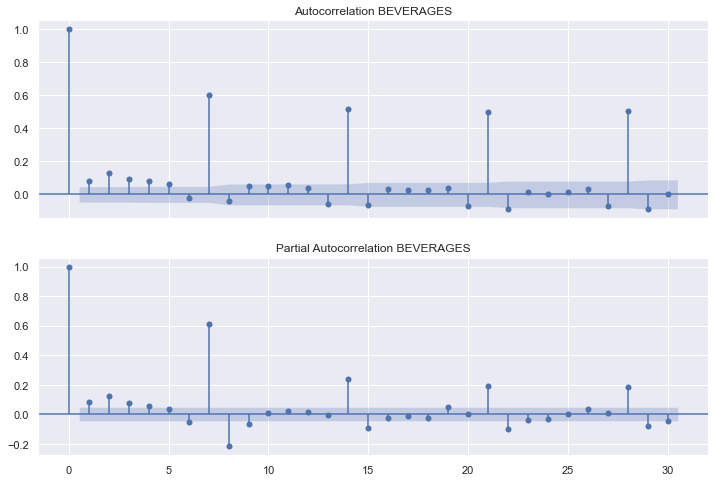

...

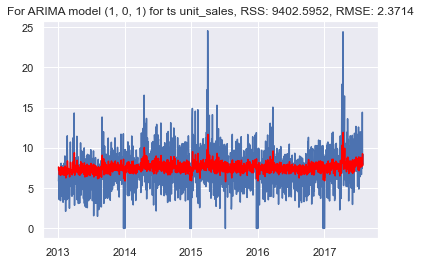

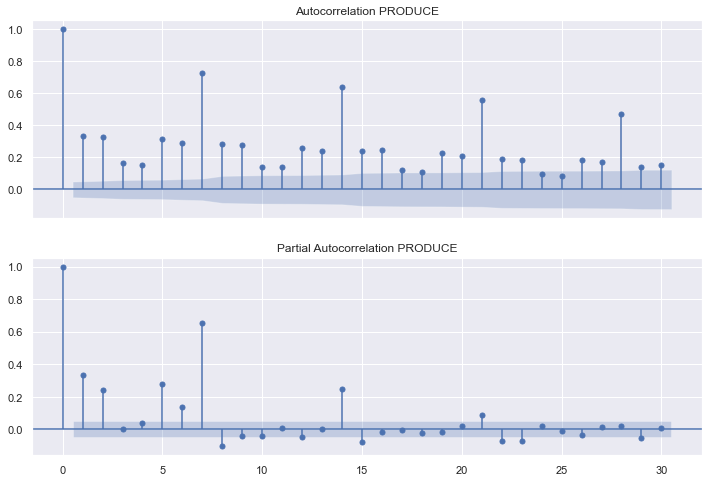

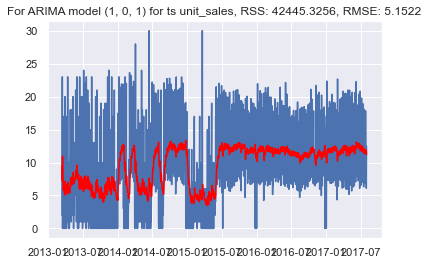

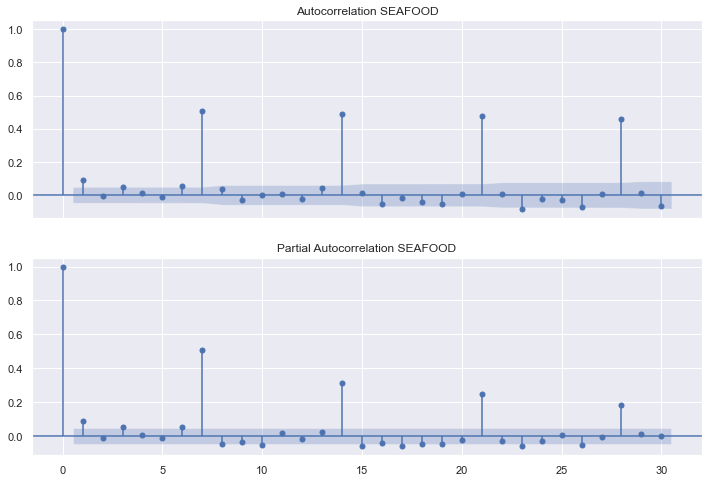

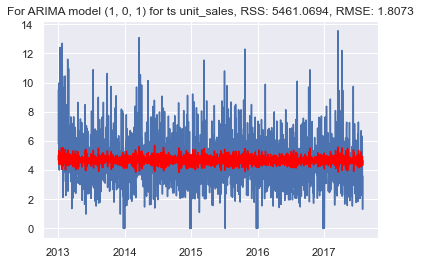

In [44]:
for family in families:
    
    train, test, y_true = create_family_data(family)
    
    fam = family.lower().replace('/','_').replace(' ','_').replace(',','_')
    
    q, p = autocorrelation_plots(train,'unit_sales', title_text=family, n_lags=30, save=True, save_as=fam+'_ACF_PACF')
    
    model, results, rmse = run_arima_model(df = train, 
                           ts = 'unit_sales', 
                           p = p, 
                           d = 0, 
                           q = q,
                           save_as=fam)
    
    predictions = results.predict(start=start_forecast, end=finish_forecast)
    rmse = calculate_rmse(y_true=y_true, y_pred=predictions)
    
    dictionary_all[family] = [rmse]

In [45]:
arima_results = list({k: v for k, v in sorted(dictionary_all.items(), key=lambda item: item[0])}.values())

In [46]:
arima_results_flattened = [x[0] for x in arima_results]

In [47]:
df_all['ARIMA'] = arima_results_flattened

In [48]:
df_all.head()

,ARIMA,Prophet,LSTM
AUTOMOTIVE,0.525746,NaN,NaN
BEAUTY,1.340806,NaN,NaN
BEVERAGES,1.466212,NaN,NaN
BREAD/BAKERY,1.451920,NaN,NaN
CELEBRATION,0.435983,NaN,NaN


<a id=facebook_all></a>

### Facebook Prophet's All

In [49]:
def prophet_all(dataframe, family_products, y_true, save_as):
    # Inputs for query
    first_date = min(dataframe.index).date().isoformat()
    last_date = max(dataframe.index).date().isoformat()
    date_column = 'date'
    metric_column = 'unit_sales'
    table = dataframe.reset_index()
    start_training_date = first_date
    end_training_date = last_date
    start_forecasting_date = max(table['date']).date() + timedelta(days=1)
    end_forecasting_date = max(table['date']).date() + timedelta(days=15)
    year_to_estimate = '2017'
    
    # get relevant data
    df_prophet = dataframe.reset_index()[['date','unit_sales']] 
    df_prophet = df_prophet.rename(columns = {'date': 'ds', 'unit_sales': 'y'}) 
    df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])
    df_prophet['y'] = pd.to_numeric(df_prophet['y'], errors='ignore')
    
    fcst = create_daily_forecast(df_prophet,
                             #cap,
                             holidays,
                             growth,
                             n_changepoints,
                             changepoint_prior_scale,
                             changepoints, 
                             holidays_prior_scale,
                             interval_width,
                             mcmc_samples,
                             future_num_points, 
                             daily_seasonality,
                             save_as=save_as)
    
    y_pred = fcst.tail(15)['yhat']
    
    print(family_products)
    rmse = calculate_rmse(y_true=y_true, y_pred=y_pred)
    print(rmse)
    
    return rmse

In [50]:
prophet_results = {}

**Getting this error for Lingerie and Hardware:**

<ipython-input-44-2725dd723fe7>:5: RuntimeWarning: divide by zero encountered in true_divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
<ipython-input-44-2725dd723fe7>:9: RuntimeWarning: divide by zero encountered in true_divide
  return np.mean((y_true - y_pred) / y_true) * 100
    
**Getting this error for Home Appliances:** 
    
<ipython-input-44-2725dd723fe7> in print_error_metrics(y_true, y_pred)
     18 
     19 def print_error_metrics(y_true, y_pred):
---> 20     print('MAPE: %f'%calculate_mape(y_true, y_pred))
     21     print('MPE: %f'%calculate_mpe(y_true, y_pred))
     22     print('MAE: %f'%calculate_mae(y_true, y_pred))

<ipython-input-44-2725dd723fe7> in calculate_mape(y_true, y_pred)
      3 def calculate_mape(y_true, y_pred):
      4     """ Calculate mean absolute percentage error (MAPE)"""
----> 5     return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
      6 
      7 def calculate_mpe(y_true, y_pred):

ValueError: operands could not be broadcast together with shapes (0,) (15,) 



  3%|▎         | 1/29 [04:38<2:10:11, 278.99s/it]

AUTOMOTIVE
0.5414722629986362


  7%|▋         | 2/29 [09:08<2:03:06, 273.56s/it]

BEAUTY
1.1984031674894329


 10%|█         | 3/29 [13:31<1:56:30, 268.85s/it]

BEVERAGES
0.9557445863589733


 14%|█▍        | 4/29 [17:55<1:51:09, 266.79s/it]

BREAD/BAKERY
0.758671304176587


 17%|█▋        | 5/29 [22:21<1:46:37, 266.58s/it]

CELEBRATION
0.6854006223386323


 21%|██        | 6/29 [26:52<1:42:44, 268.00s/it]

CLEANING
0.49784202626982665


 24%|██▍       | 7/29 [31:15<1:37:40, 266.39s/it]

DAIRY
0.5501377105728104


 28%|██▊       | 8/29 [35:41<1:33:09, 266.19s/it]

DELI
0.3463447746643405


 31%|███       | 9/29 [40:28<1:30:51, 272.59s/it]

EGGS
0.6609532299610006


 34%|███▍      | 10/29 [45:53<1:31:27, 288.81s/it]

FROZEN FOODS
1.5311706812850492


 38%|███▊      | 11/29 [51:20<1:30:07, 300.44s/it]

GROCERY I
0.47972626144973407


 41%|████▏     | 12/29 [57:06<1:29:03, 314.30s/it]

GROCERY II
0.8830410453550925


 45%|████▍     | 13/29 [1:02:51<1:26:18, 323.65s/it]

HARDWARE
0.904758113970667


 48%|████▊     | 14/29 [1:08:31<1:22:10, 328.72s/it]

HOME AND KITCHEN I
1.7263956840495085


 52%|█████▏    | 15/29 [1:14:14<1:17:39, 332.85s/it]

HOME AND KITCHEN II
1.603369112819274


 55%|█████▌    | 16/29 [1:20:17<1:14:07, 342.14s/it]

HOME CARE
0.44366923923742474


 59%|█████▊    | 17/29 [1:25:57<1:08:17, 341.49s/it]

LADIESWEAR
0.7574204708650034


 62%|██████▏   | 18/29 [1:31:28<1:01:59, 338.17s/it]

LAWN AND GARDEN
0.8534888597516043


 66%|██████▌   | 19/29 [1:37:09<56:30, 339.00s/it]  

LINGERIE
2.2250187060558972


 69%|██████▉   | 20/29 [1:42:52<51:04, 340.47s/it]

LIQUOR,WINE,BEER
1.7074289450863045


 72%|███████▏  | 21/29 [1:47:50<43:41, 327.69s/it]

MAGAZINES
1.227521755708068


 76%|███████▌  | 22/29 [1:52:38<36:49, 315.61s/it]

MEATS
1.631308567312294


 79%|███████▉  | 23/29 [1:57:25<30:41, 306.93s/it]

PERSONAL CARE
0.7061567588390897


 83%|████████▎ | 24/29 [2:02:07<24:58, 299.60s/it]

PET SUPPLIES
0.6447923736958071


 86%|████████▌ | 25/29 [2:08:47<21:58, 329.63s/it]

PLAYERS AND ELECTRONICS
0.6813036354673947


 90%|████████▉ | 26/29 [2:15:31<17:35, 351.90s/it]

POULTRY
0.01585503902042043


 93%|█████████▎| 27/29 [2:20:47<11:22, 341.26s/it]

PREPARED FOODS
3.040856618542089


 97%|█████████▋| 28/29 [2:25:45<05:28, 328.29s/it]

PRODUCE
3.262213344045427


100%|██████████| 29/29 [2:30:30<00:00, 311.40s/it]

SEAFOOD
2.6220952082680062


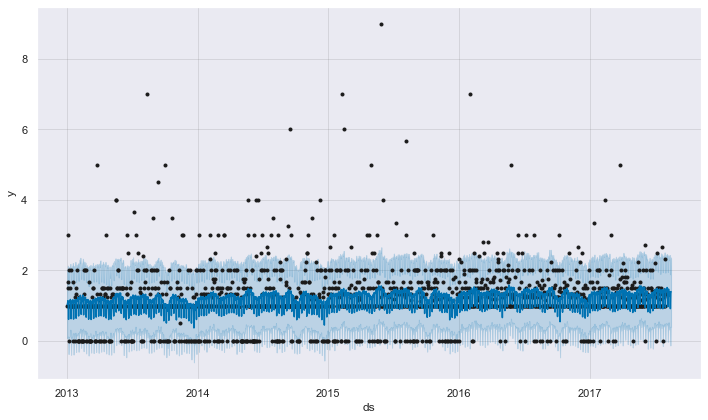

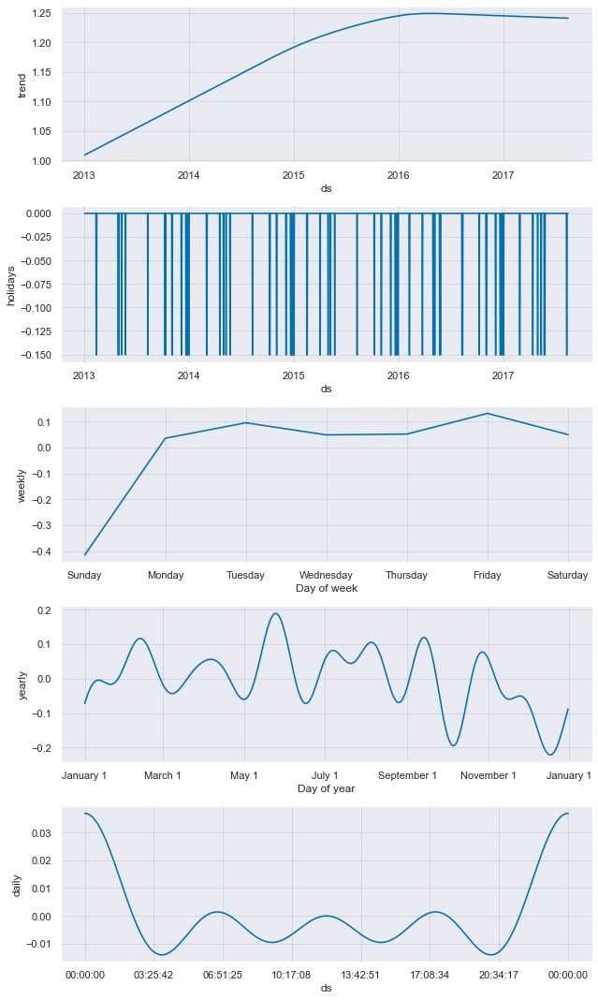

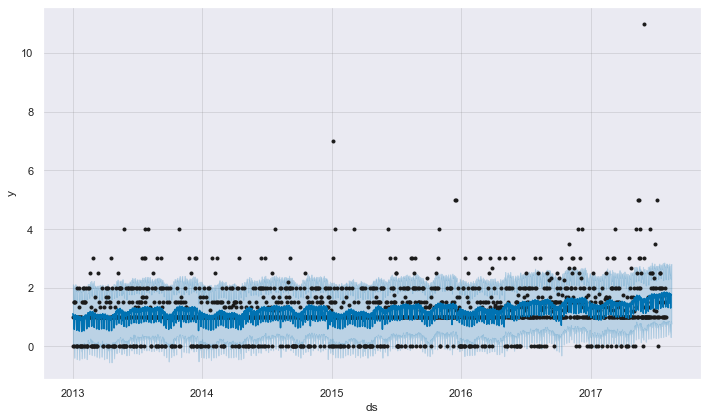

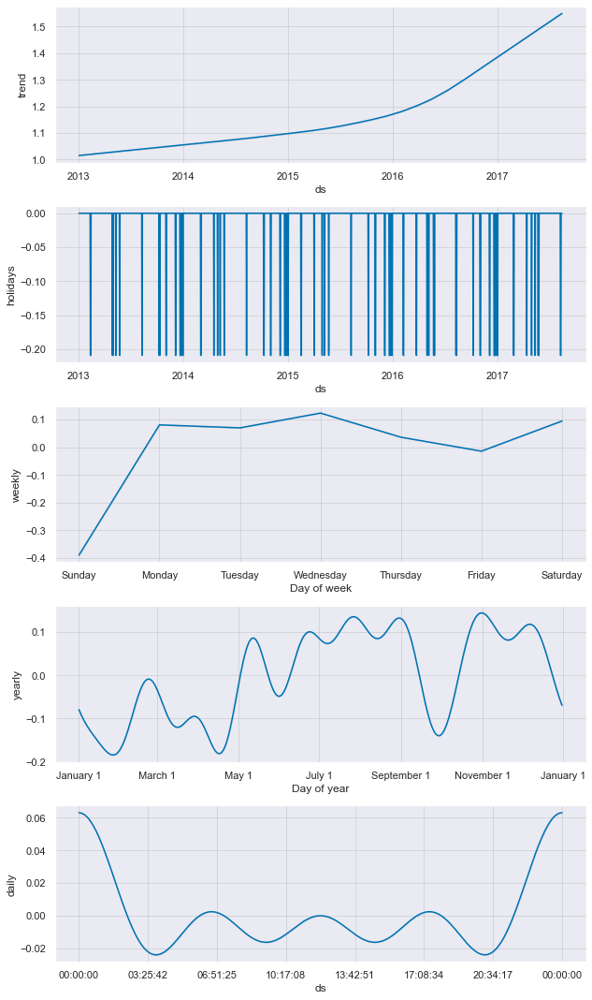

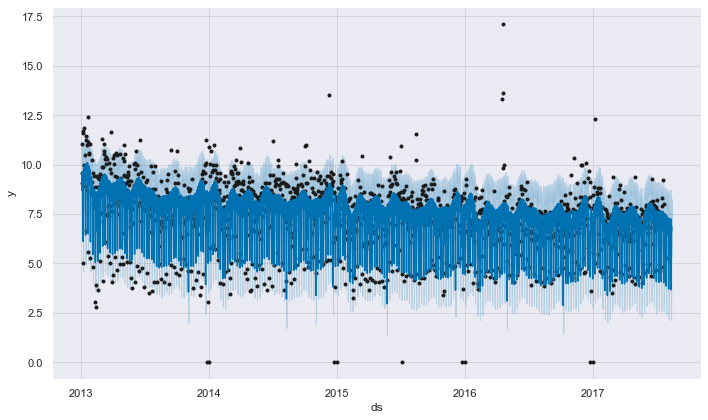

...

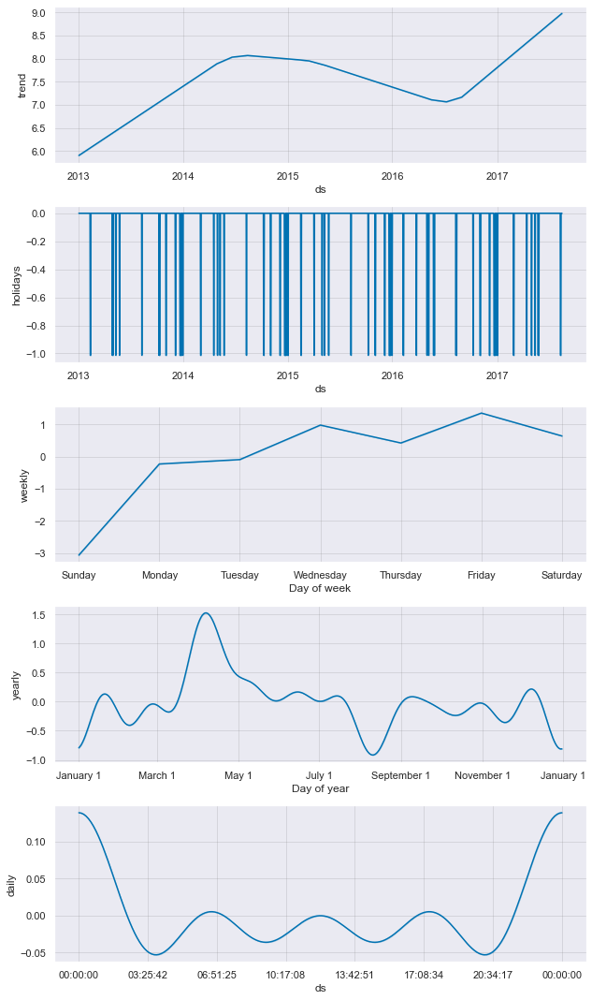

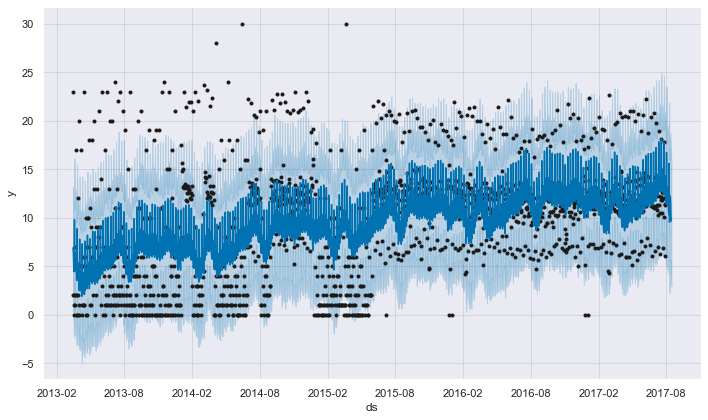

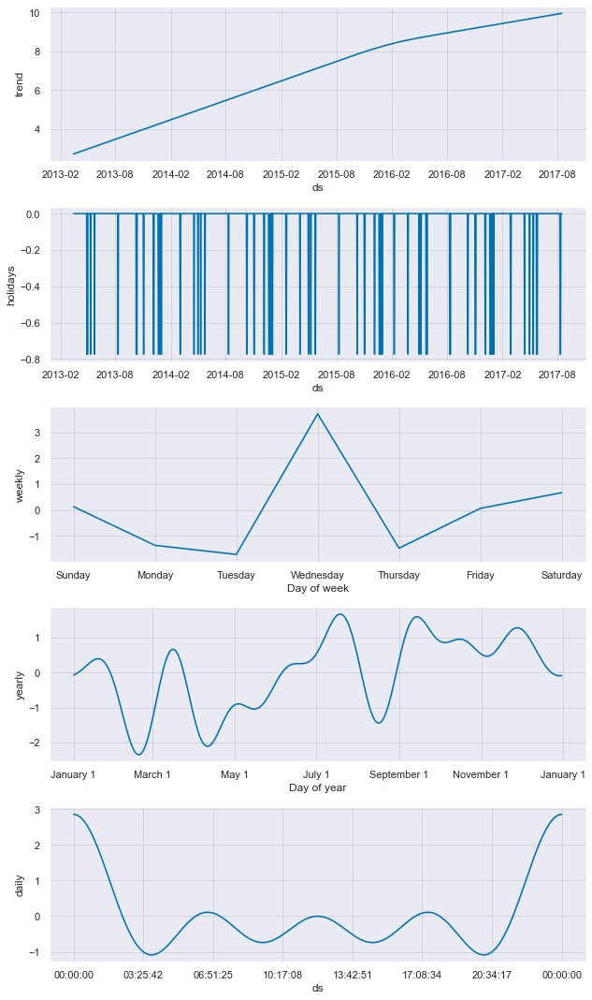

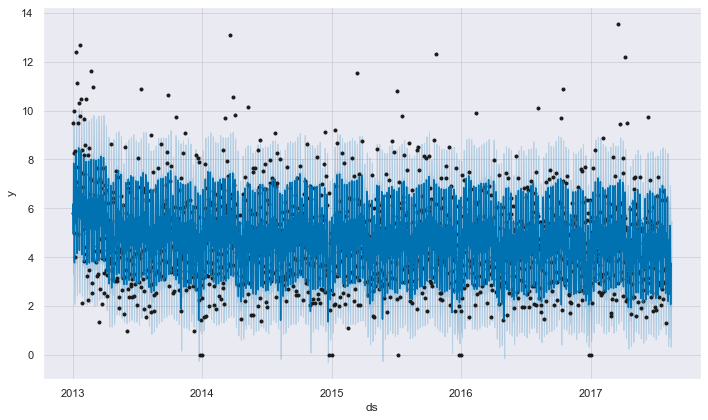

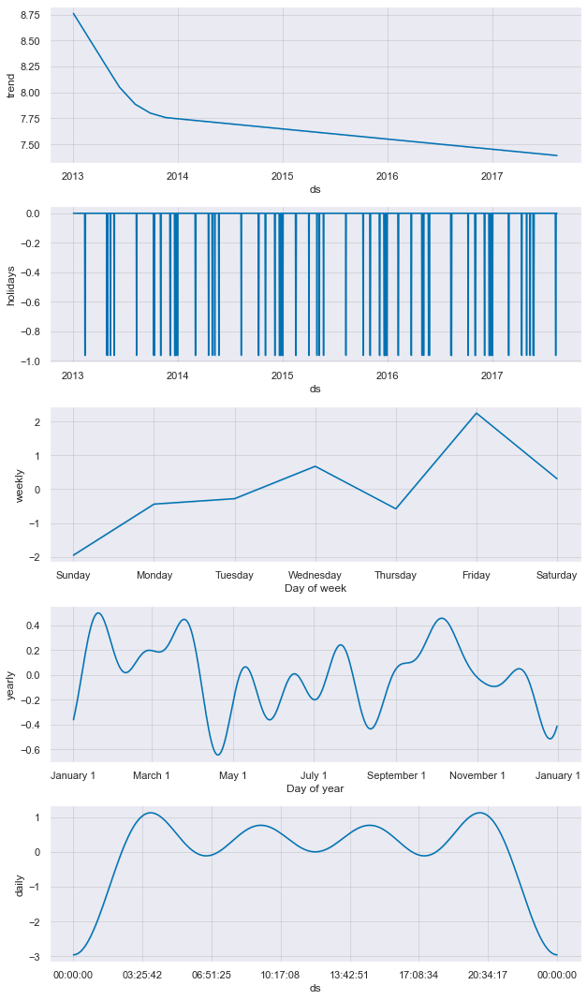

In [51]:
for family in tqdm(families):
    train, test, y_true = create_family_data(family)
    fam = family.lower().replace('/','_').replace(' ','_').replace(',','_')
    result = prophet_all(dataframe=train, family_products=family, y_true=y_true, save_as=fam)
    prophet_results[family] = result

In [57]:
df_all['Prophet'] = list(prophet_results.values())

In [58]:
df_all.head()

,ARIMA,Prophet,LSTM
AUTOMOTIVE,0.525746,0.541472,NaN
BEAUTY,1.340806,1.198403,NaN
BEVERAGES,1.466212,0.955745,NaN
BREAD/BAKERY,1.451920,0.758671,NaN
CELEBRATION,0.435983,0.685401,NaN


<a id=rnn_all></a>

### RNN All

In [59]:
rnn_all = {}

Epoch 1/5
3891/3891 - 6s - loss: 0.0036
Epoch 2/5
3891/3891 - 4s - loss: 0.0033
Epoch 3/5
3891/3891 - 4s - loss: 0.0033
Epoch 4/5
3891/3891 - 4s - loss: 0.0033
Epoch 5/5
3891/3891 - 4s - loss: 0.0033
Train Score: 0.92 RMSE
Test Score: 0.47 RMSE


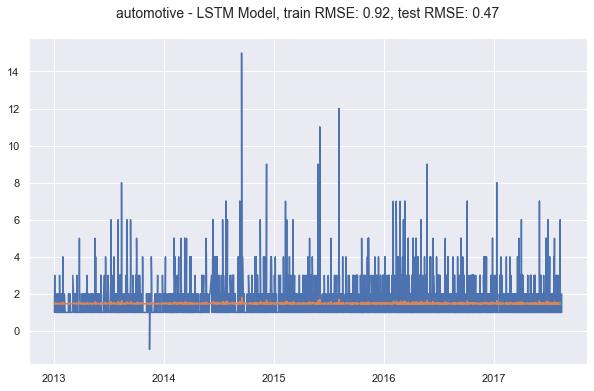

Epoch 1/5
2844/2844 - 5s - loss: 0.0058
Epoch 2/5
2844/2844 - 3s - loss: 0.0045
Epoch 3/5
2844/2844 - 3s - loss: 0.0045
Epoch 4/5
2844/2844 - 3s - loss: 0.0045
Epoch 5/5
2844/2844 - 3s - loss: 0.0045
Train Score: 0.80 RMSE
Test Score: 1.96 RMSE


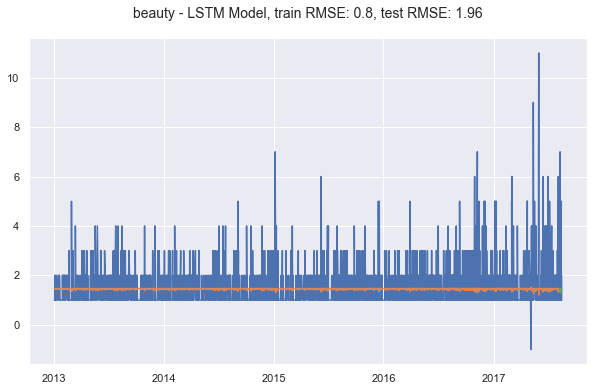

Epoch 1/5
361143/361143 - 422s - loss: 2.8120e-04
Epoch 2/5
361143/361143 - 401s - loss: 2.7890e-04
Epoch 3/5
361143/361143 - 400s - loss: 2.7876e-04
Epoch 4/5
361143/361143 - 401s - loss: 2.7884e-04
Epoch 5/5
361143/361143 - 400s - loss: 2.7889e-04
Train Score: 11.23 RMSE
Test Score: 14.79 RMSE


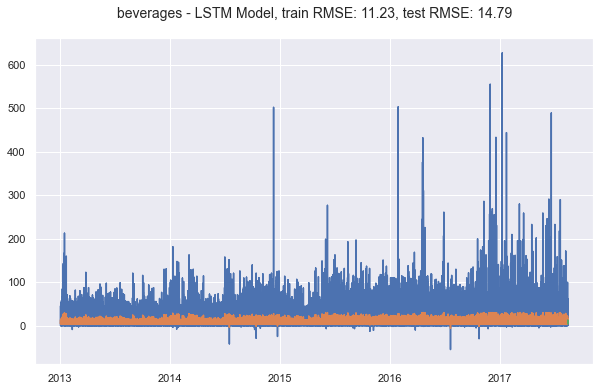

Epoch 1/5
101566/101566 - 113s - loss: 0.0034
Epoch 2/5
101566/101566 - 119s - loss: 0.0034
Epoch 3/5
101566/101566 - 110s - loss: 0.0034
Epoch 4/5
101566/101566 - 110s - loss: 0.0034
Epoch 5/5
101566/101566 - 112s - loss: 0.0034
Train Score: 6.57 RMSE
Test Score: 6.68 RMSE


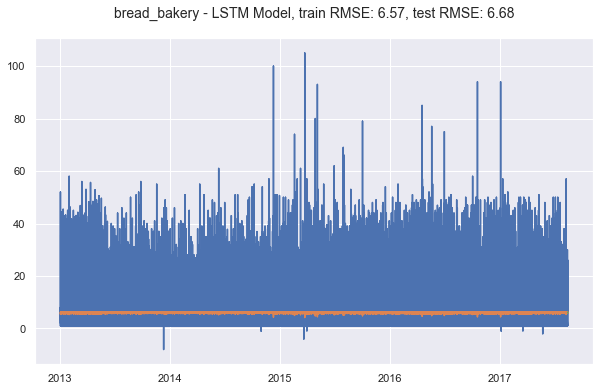

Epoch 1/5
7857/7857 - 10s - loss: 1.3167e-04
Epoch 2/5
7857/7857 - 9s - loss: 1.3235e-04
Epoch 3/5
7857/7857 - 9s - loss: 1.3221e-04
Epoch 4/5
7857/7857 - 9s - loss: 1.3191e-04
Epoch 5/5
7857/7857 - 9s - loss: 1.3133e-04
Train Score: 14.71 RMSE
Test Score: 1.28 RMSE


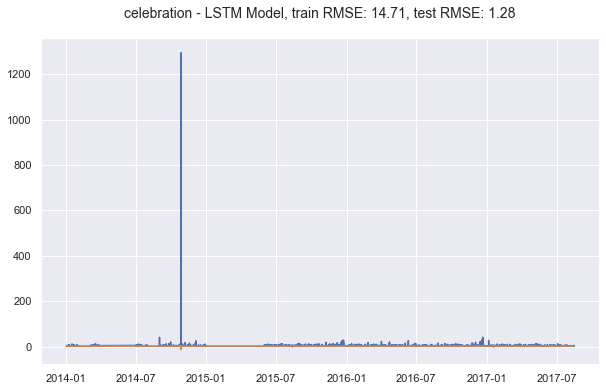

Epoch 1/5
299732/299732 - 331s - loss: 2.0572e-04
Epoch 2/5
299732/299732 - 325s - loss: 2.0373e-04
Epoch 3/5
299732/299732 - 327s - loss: 2.0340e-04
Epoch 4/5
299732/299732 - 327s - loss: 2.0338e-04
Epoch 5/5
299732/299732 - 329s - loss: 2.0331e-04
Train Score: 4.61 RMSE
Test Score: 1.86 RMSE


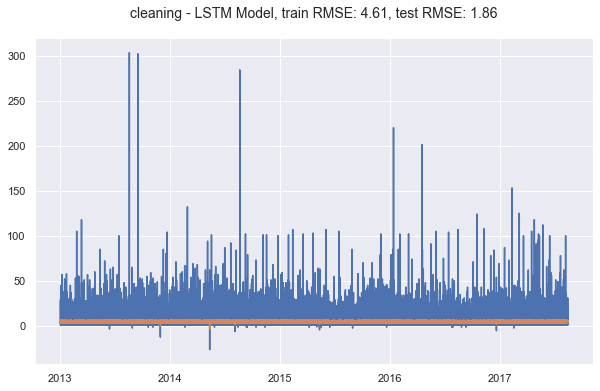

Epoch 1/5
210251/210251 - 234s - loss: 0.0026
Epoch 2/5
210251/210251 - 234s - loss: 0.0026
Epoch 3/5
210251/210251 - 230s - loss: 0.0026
Epoch 4/5
210251/210251 - 231s - loss: 0.0026
Epoch 5/5
210251/210251 - 230s - loss: 0.0026
Train Score: 5.40 RMSE
Test Score: 1.50 RMSE


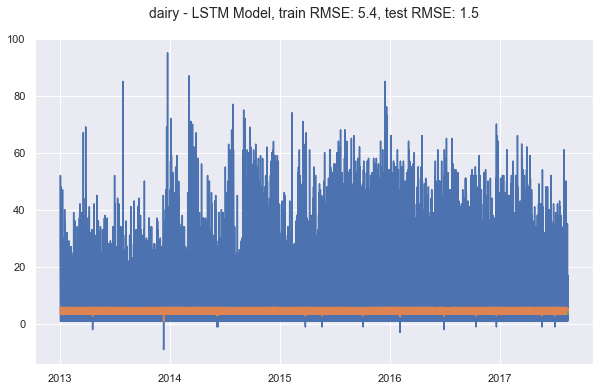

Epoch 1/5
71255/71255 - 82s - loss: 0.0016
Epoch 2/5
71255/71255 - 78s - loss: 0.0016
Epoch 3/5
71255/71255 - 79s - loss: 0.0016
Epoch 4/5
71255/71255 - 79s - loss: 0.0016
Epoch 5/5
71255/71255 - 80s - loss: 0.0016
Train Score: 2.83 RMSE
Test Score: 2.09 RMSE


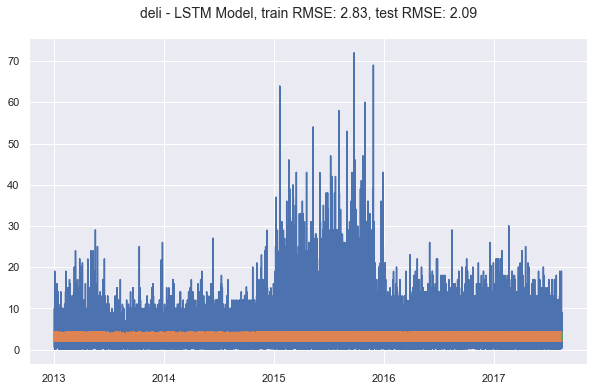

Epoch 1/5
42350/42350 - 49s - loss: 0.0048
Epoch 2/5
42350/42350 - 46s - loss: 0.0048
Epoch 3/5
42350/42350 - 45s - loss: 0.0048
Epoch 4/5
42350/42350 - 46s - loss: 0.0048
Epoch 5/5
42350/42350 - 46s - loss: 0.0048
Train Score: 5.23 RMSE
Test Score: 6.74 RMSE


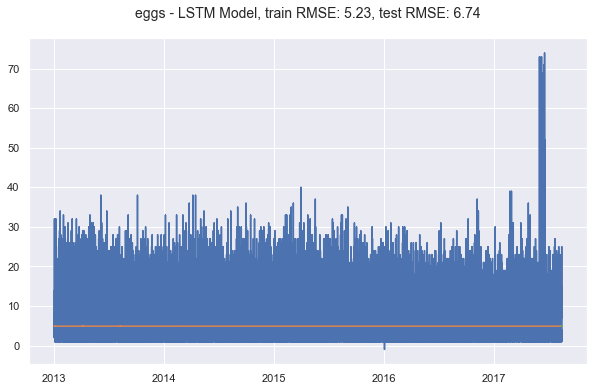

Epoch 1/5
37782/37782 - 44s - loss: 3.4798e-05
Epoch 2/5
37782/37782 - 43s - loss: 3.4694e-05
Epoch 3/5
37782/37782 - 42s - loss: 3.4866e-05
Epoch 4/5
37782/37782 - 43s - loss: 3.4671e-05
Epoch 5/5
37782/37782 - 42s - loss: 3.4684e-05
Train Score: 27.40 RMSE
Test Score: 9.26 RMSE


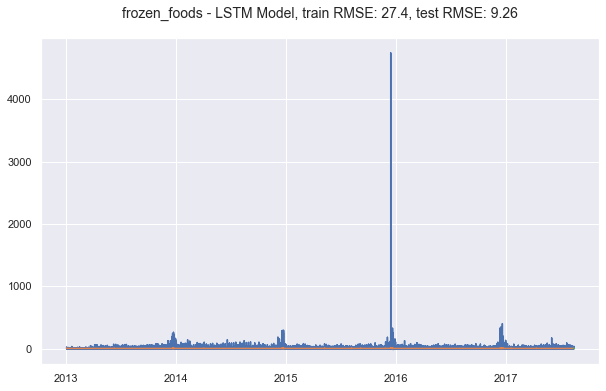

Epoch 1/5
880263/880263 - 978s - loss: 2.2680e-05
Epoch 2/5
880263/880263 - 966s - loss: 2.1400e-05
Epoch 3/5
880263/880263 - 963s - loss: 2.1427e-05
Epoch 4/5
880263/880263 - 965s - loss: 2.1424e-05
Epoch 5/5
880263/880263 - 964s - loss: 2.1413e-05
Train Score: 6.54 RMSE
Test Score: 3.09 RMSE


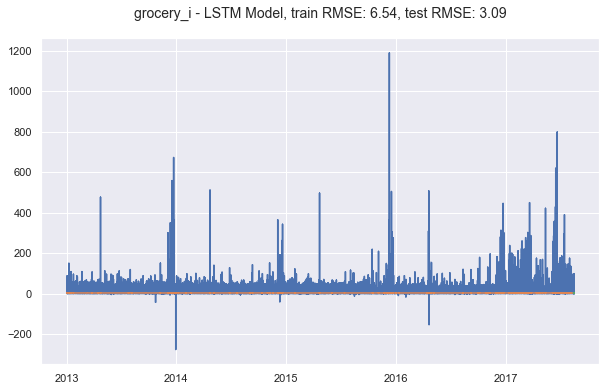

Epoch 1/5
7418/7418 - 10s - loss: 0.0035
Epoch 2/5
7418/7418 - 9s - loss: 0.0035
Epoch 3/5
7418/7418 - 9s - loss: 0.0035
Epoch 4/5
7418/7418 - 9s - loss: 0.0035
Epoch 5/5
7418/7418 - 8s - loss: 0.0035
Train Score: 5.80 RMSE
Test Score: 3.00 RMSE


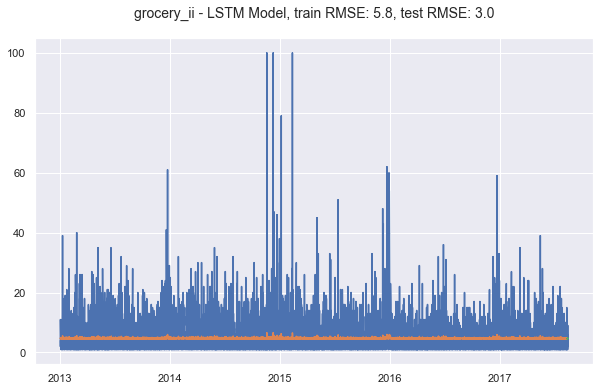

Epoch 1/5
1787/1787 - 4s - loss: 0.0089
Epoch 2/5
1787/1787 - 2s - loss: 0.0089
Epoch 3/5
1787/1787 - 2s - loss: 0.0089
Epoch 4/5
1787/1787 - 2s - loss: 0.0089
Epoch 5/5
1787/1787 - 2s - loss: 0.0088
Train Score: 0.94 RMSE
Test Score: 0.60 RMSE


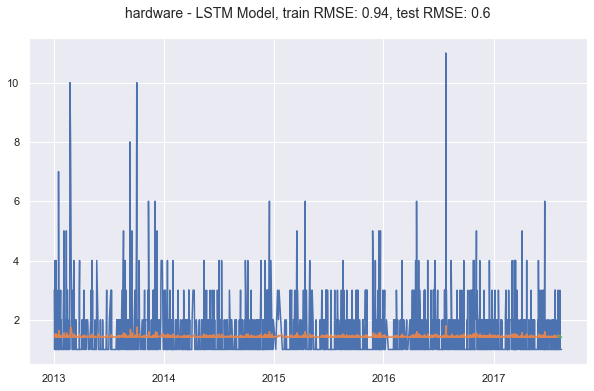

Epoch 1/5
8023/8023 - 10s - loss: 8.0623e-04
Epoch 2/5
8023/8023 - 9s - loss: 7.9521e-04
Epoch 3/5
8023/8023 - 9s - loss: 7.7769e-04
Epoch 4/5
8023/8023 - 9s - loss: 7.8265e-04
Epoch 5/5
8023/8023 - 9s - loss: 7.7146e-04
Train Score: 6.14 RMSE
Test Score: 1.73 RMSE


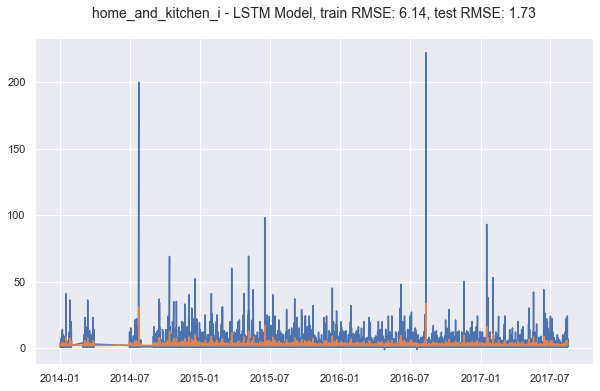

Epoch 1/5
6416/6416 - 9s - loss: 8.0234e-04
Epoch 2/5
6416/6416 - 7s - loss: 7.8158e-04
Epoch 3/5
6416/6416 - 8s - loss: 7.8303e-04
Epoch 4/5
6416/6416 - 8s - loss: 7.7988e-04
Epoch 5/5
6416/6416 - 7s - loss: 7.7958e-04
Train Score: 7.55 RMSE
Test Score: 2.06 RMSE


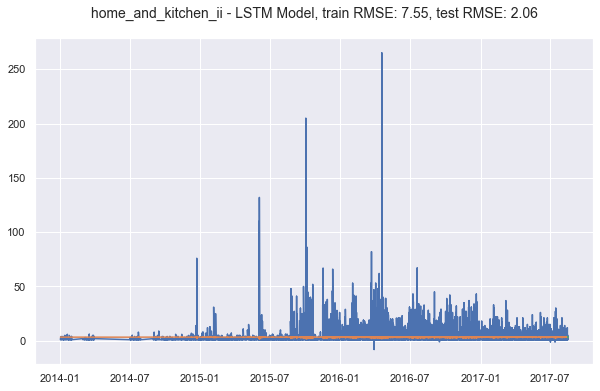

Epoch 1/5
52957/52957 - 60s - loss: 4.2920e-04
Epoch 2/5
52957/52957 - 59s - loss: 7.3315e-05
Epoch 3/5
52957/52957 - 59s - loss: 7.2261e-05
Epoch 4/5
52957/52957 - 60s - loss: 7.2117e-05
Epoch 5/5
52957/52957 - 59s - loss: 7.1592e-05
Train Score: 3.50 RMSE
Test Score: 2.40 RMSE


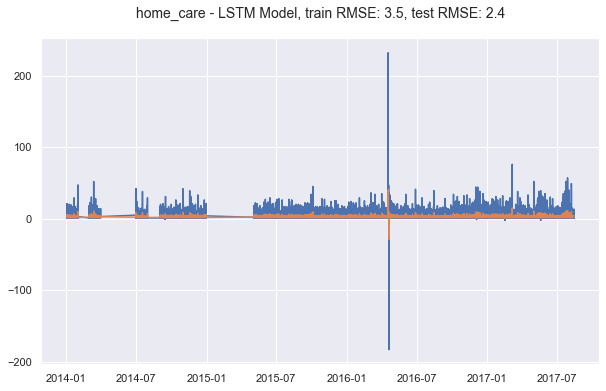

Epoch 1/5
8453/8453 - 11s - loss: 0.0067
Epoch 2/5
8453/8453 - 9s - loss: 0.0061
Epoch 3/5
8453/8453 - 10s - loss: 0.0061
Epoch 4/5
8453/8453 - 9s - loss: 0.0061
Epoch 5/5
8453/8453 - 10s - loss: 0.0061
Train Score: 1.33 RMSE
Test Score: 0.67 RMSE


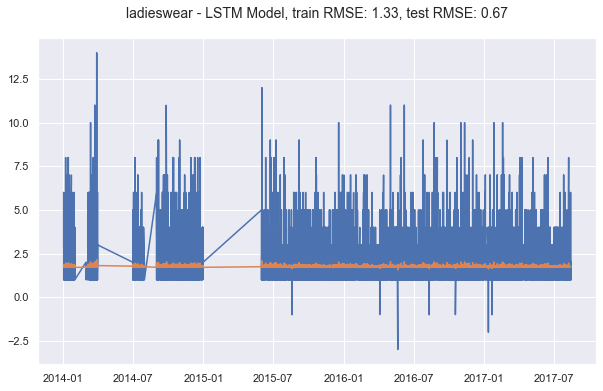

Epoch 1/5
4415/4415 - 6s - loss: 0.0015
Epoch 2/5
4415/4415 - 5s - loss: 0.0015
Epoch 3/5
4415/4415 - 5s - loss: 0.0015
Epoch 4/5
4415/4415 - 5s - loss: 0.0015
Epoch 5/5
4415/4415 - 5s - loss: 0.0015
Train Score: 3.13 RMSE
Test Score: 2.11 RMSE


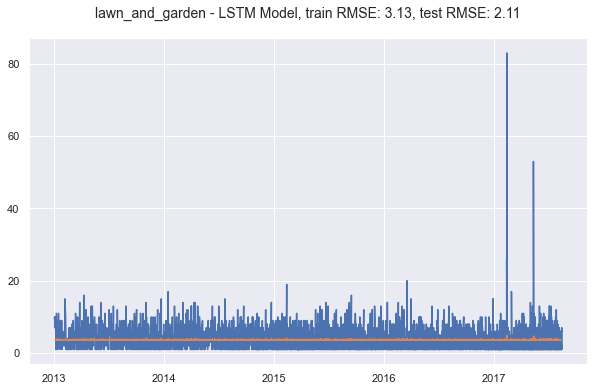

Epoch 1/5
4873/4873 - 7s - loss: 0.0076
Epoch 2/5
4873/4873 - 5s - loss: 0.0074
Epoch 3/5
4873/4873 - 6s - loss: 0.0074
Epoch 4/5
4873/4873 - 5s - loss: 0.0074
Epoch 5/5
4873/4873 - 6s - loss: 0.0074
Train Score: 2.22 RMSE
Test Score: 4.17 RMSE


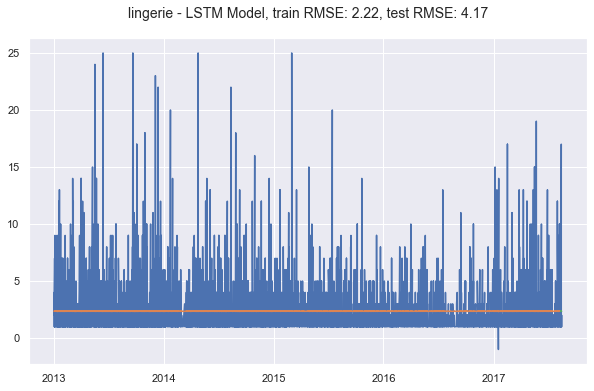

Epoch 1/5
26170/26170 - 30s - loss: 0.0019
Epoch 2/5
26170/26170 - 30s - loss: 0.0018
Epoch 3/5
26170/26170 - 30s - loss: 0.0018
Epoch 4/5
26170/26170 - 29s - loss: 0.0018
Epoch 5/5
26170/26170 - 30s - loss: 0.0018
Train Score: 7.48 RMSE
Test Score: 4.56 RMSE


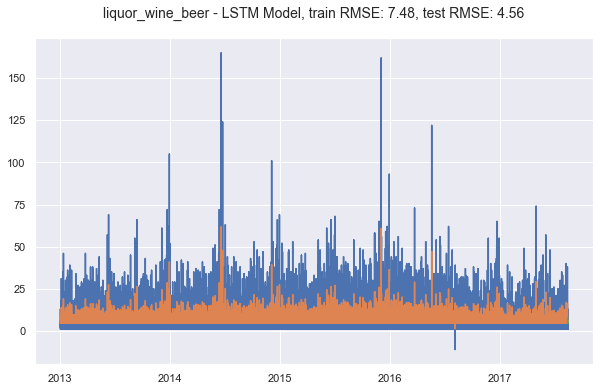

Epoch 1/5
2351/2351 - 4s - loss: 0.0121
Epoch 2/5
2351/2351 - 3s - loss: 0.0115
Epoch 3/5
2351/2351 - 3s - loss: 0.0115
Epoch 4/5
2351/2351 - 3s - loss: 0.0115
Epoch 5/5
2351/2351 - 3s - loss: 0.0115
Train Score: 1.82 RMSE
Test Score: 1.37 RMSE


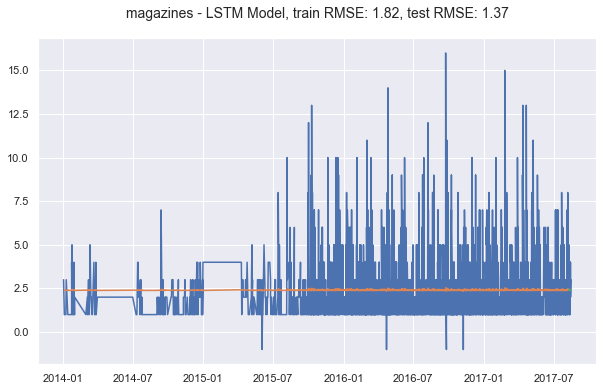

Epoch 1/5
66294/66294 - 73s - loss: 7.0962e-04
Epoch 2/5
66294/66294 - 78s - loss: 7.0794e-04
Epoch 3/5
66294/66294 - 73s - loss: 7.0833e-04
Epoch 4/5
66294/66294 - 72s - loss: 7.0790e-04
Epoch 5/5
66294/66294 - 71s - loss: 7.0606e-04
Train Score: 16.27 RMSE
Test Score: 11.63 RMSE


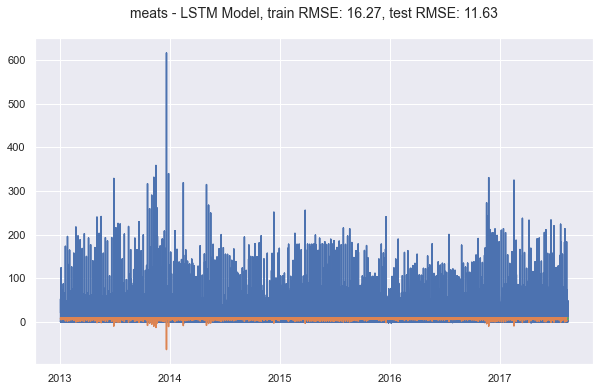

Epoch 1/5
78749/78749 - 88s - loss: 3.9811e-05
Epoch 2/5
78749/78749 - 87s - loss: 3.9587e-05
Epoch 3/5
78749/78749 - 90s - loss: 3.9513e-05
Epoch 4/5
78749/78749 - 86s - loss: 3.9521e-05
Epoch 5/5
78749/78749 - 87s - loss: 3.9427e-05
Train Score: 3.86 RMSE
Test Score: 0.99 RMSE


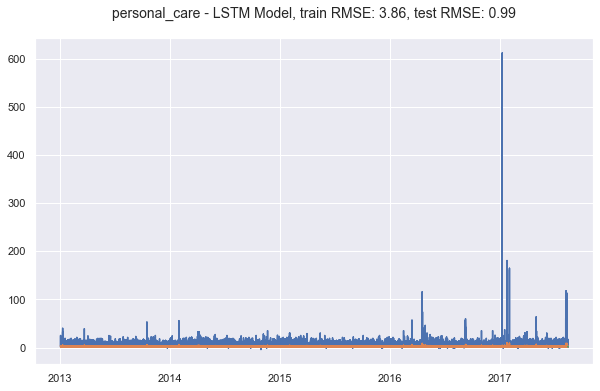

Epoch 1/5
3499/3499 - 5s - loss: 0.0051
Epoch 2/5
3499/3499 - 4s - loss: 0.0047
Epoch 3/5
3499/3499 - 4s - loss: 0.0047
Epoch 4/5
3499/3499 - 4s - loss: 0.0047
Epoch 5/5
3499/3499 - 4s - loss: 0.0047
Train Score: 1.09 RMSE
Test Score: 0.72 RMSE


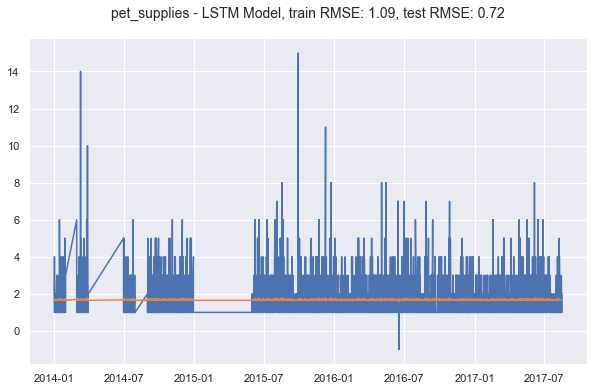

Epoch 1/5
4868/4868 - 7s - loss: 0.0043
Epoch 2/5
4868/4868 - 5s - loss: 0.0039
Epoch 3/5
4868/4868 - 5s - loss: 0.0039
Epoch 4/5
4868/4868 - 5s - loss: 0.0039
Epoch 5/5
4868/4868 - 6s - loss: 0.0039
Train Score: 1.42 RMSE
Test Score: 3.20 RMSE


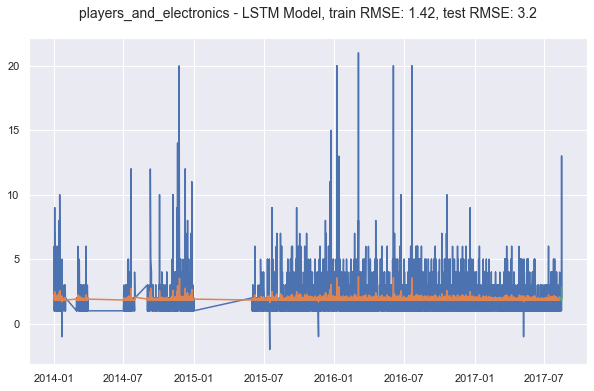

Epoch 1/5
47727/47727 - 54s - loss: 9.0116e-04
Epoch 2/5
47727/47727 - 52s - loss: 6.0714e-04
Epoch 3/5
47727/47727 - 51s - loss: 5.9652e-04
Epoch 4/5
47727/47727 - 52s - loss: 5.8878e-04
Epoch 5/5
47727/47727 - 52s - loss: 5.8189e-04
Train Score: 0.31 RMSE
Test Score: 0.20 RMSE


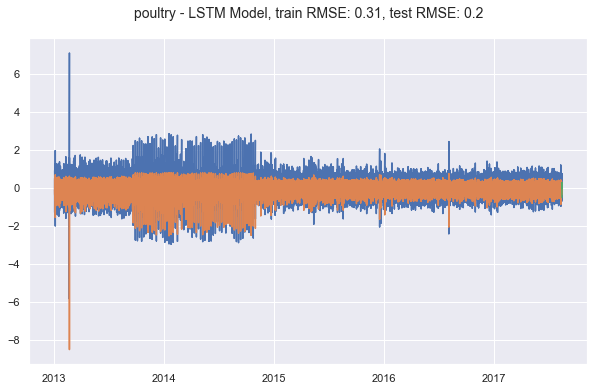

Epoch 1/5
17685/17685 - 21s - loss: 0.0030
Epoch 2/5
17685/17685 - 19s - loss: 0.0030
Epoch 3/5
17685/17685 - 20s - loss: 0.0029
Epoch 4/5
17685/17685 - 19s - loss: 0.0029
Epoch 5/5
17685/17685 - 20s - loss: 0.0029
Train Score: 7.31 RMSE
Test Score: 6.14 RMSE


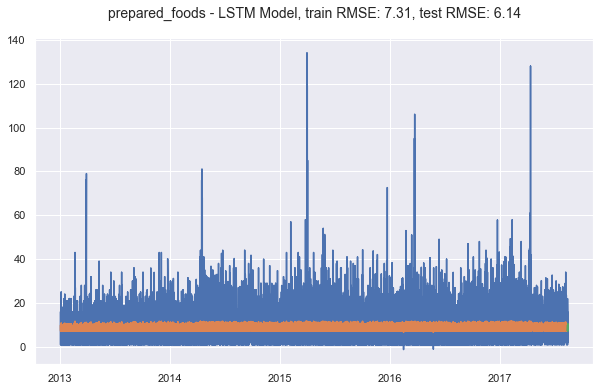

Epoch 1/5
197656/197656 - 220s - loss: 0.0037
Epoch 2/5
197656/197656 - 217s - loss: 0.0037
Epoch 3/5
197656/197656 - 217s - loss: 0.0037
Epoch 4/5
197656/197656 - 222s - loss: 0.0037
Epoch 5/5
197656/197656 - 218s - loss: 0.0037
Train Score: 18.06 RMSE
Test Score: 5.59 RMSE


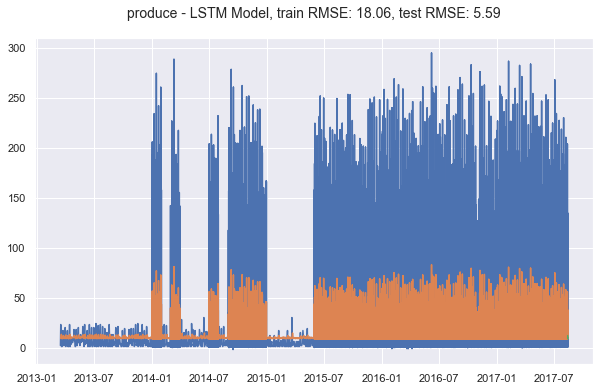

Epoch 1/5
9291/9291 - 12s - loss: 0.0039
Epoch 2/5
9291/9291 - 10s - loss: 0.0038
Epoch 3/5
9291/9291 - 10s - loss: 0.0038
Epoch 4/5
9291/9291 - 10s - loss: 0.0038
Epoch 5/5
9291/9291 - 10s - loss: 0.0038
Train Score: 3.62 RMSE
Test Score: 2.72 RMSE


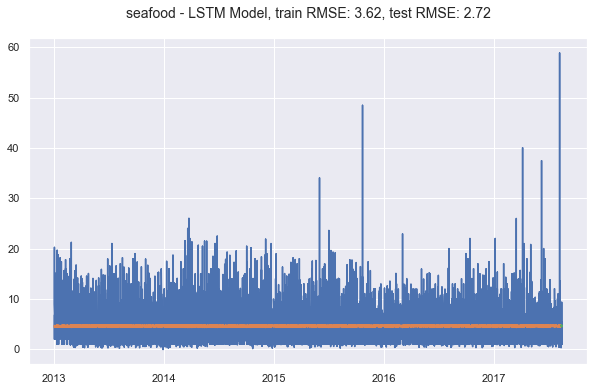

In [60]:
for family in families:
    df_family = df[df['family']==family][['unit_sales']]

    fam = family.lower().replace('/','_').replace(' ','_').replace(',','_')
    
    model, train_score, test_score = do_lstm_model(df=df_family,
              ts = 'unit_sales', 
              look_back = 1, 
              epochs = 5,
              use_as_test_last_days=15,
              save_as=fam)
    
    rnn_all[family] = [train_score, test_score]
    

In [61]:
rnn_all

{'AUTOMOTIVE': [0.9158288680999134, 0.46548986610963333],
 'BEAUTY': [0.8003904832905195, 1.955808625321578],
 'BEVERAGES': [11.228420453761288, 14.786714706807286],
 'BREAD/BAKERY': [6.574877126227456, 6.68213526282769],
 'CELEBRATION': [14.712920819152345, 1.2802355136625003],
 'CLEANING': [4.610320776949268, 1.8630602545473764],
 'DAIRY': [5.398369372975359, 1.5031983292749953],
 'DELI': [2.833682205424277, 2.0888210712684026],
 'EGGS': [5.231882717856343, 6.742007418825059],
 'FROZEN FOODS': [27.39961421376855, 9.257349738326798],
 'GROCERY I': [6.535058664001608, 3.092539651446964],
 'GROCERY II': [5.804377116715244, 2.997685239966063],
 'HARDWARE': [0.9392115576338372, 0.598749711829417],
 'HOME AND KITCHEN I': [6.136058058641491, 1.7297805316584365],
 'HOME AND KITCHEN II': [7.548849698861035, 2.056229256760248],
 'HOME CARE': [3.498762413579968, 2.4020290870490735],
 'LADIESWEAR': [1.3288929550915678, 0.6747696468133869],
 'LAWN AND GARDEN': [3.1336382805048077, 2.1114152329935

In [66]:
rnn_results = [x[1] for x in list(rnn_all.values())]

In [67]:
df_all['LSTM'] = rnn_results

In [86]:
df_all.style.highlight_min(color = 'lightgreen', axis = 1)

,ARIMA,Prophet,LSTM
AUTOMOTIVE,0.525746,0.541472,0.465490
BEAUTY,1.340806,1.198403,1.955809
BEVERAGES,1.466212,0.955745,14.786715
BREAD/BAKERY,1.451920,0.758671,6.682135
CELEBRATION,0.435983,0.685401,1.280236
CLEANING,0.887524,0.497842,1.863060
DAIRY,1.269237,0.550138,1.503198
DELI,0.513029,0.346345,2.088821
EGGS,1.148606,0.660953,6.742007
FROZEN FOODS,1.596824,1.531171,9.257350


<a id='saving'></a>


## Saving the results
***

In [54]:
# we finally save our results
df_all.to_csv('modeling_results.csv')